<a href="https://colab.research.google.com/github/suvranath1/StudyGroup/blob/master/workbook/exercise4-5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 4-5: Cell type clustering and spatial distribution of clusters 

Dataset:
Vizgen Data Release V1.0. May 2021

In [1]:
# Install and import packages
!pip install umap-learn
from umap import UMAP # this is installed by us

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=28dbcde6c839164a5fd592014382ed6750e39871a8f4ca55dacfd32f6ad08fd7
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=401c414a2a0de70a679864e150be1c5cb6018c36727d25f3a2891d3df5cc4691
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


In [2]:
# Install and import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import time

# set plot style
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set_context('talk')

np.set_printoptions(precision=2)
np.set_printoptions(suppress=True)

In [3]:
# functions (the teacher wrote for you to use later)
def rot2d(x, y, theta, unit='degree'):
    """ rotate data points defined by `x` and `y` by `theta` degree
    """
    a = np.vstack([x,y]).T
    if unit == 'degree':
        theta = theta*np.pi/180 # convert to radian

    R = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
    ar = a.dot(R.T)
    return ar[:,0], ar[:,1]

def st_scatter(x, y, gexp=None, vmax_p=98, title='', s=1):
    """customized scatter plot -- yesterday's progress
    """

    fig, ax = plt.subplots(figsize=(10,8))
    if gexp is not None:
        vmax = np.percentile(gexp, vmax_p)
        g = ax.scatter(x, y, c=gexp, s=s, edgecolor='none', vmax=vmax)
        fig.colorbar(g, label='log10(1+count)', shrink=0.3)
    else:
        g = ax.scatter(x, y, s=s, edgecolor='none')
  
    ax.set_title(title)
    ax.set_aspect('equal')
  
    return 

In [4]:
np.random.seed(0) # for reproducibility

## Load data

In [5]:
# this might take ~5 seconds
f = "https://raw.githubusercontent.com/FangmingXie/collab-workshop-st/main/data/vizgen_mouse_brain_S2R2.csv.gz"
data = pd.read_csv(f, index_col=0)
data

,x,y,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
0,594.918018,5628.150243,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,0.0
1,576.450018,5762.286246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,2.0,0.0,1.0,4.0,0.0,3.0,0.0,0.0,0.0
2,564.462017,5721.624245,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,538.164017,5605.475642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,610.362018,5652.936244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,9235.566329,3349.566107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
84168,9225.738329,3261.654105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,3.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0
84169,9230.976329,3287.358106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0
84170,9236.754329,3364.956108,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


## Check cell locations, rotation, and visualization of gene expression.

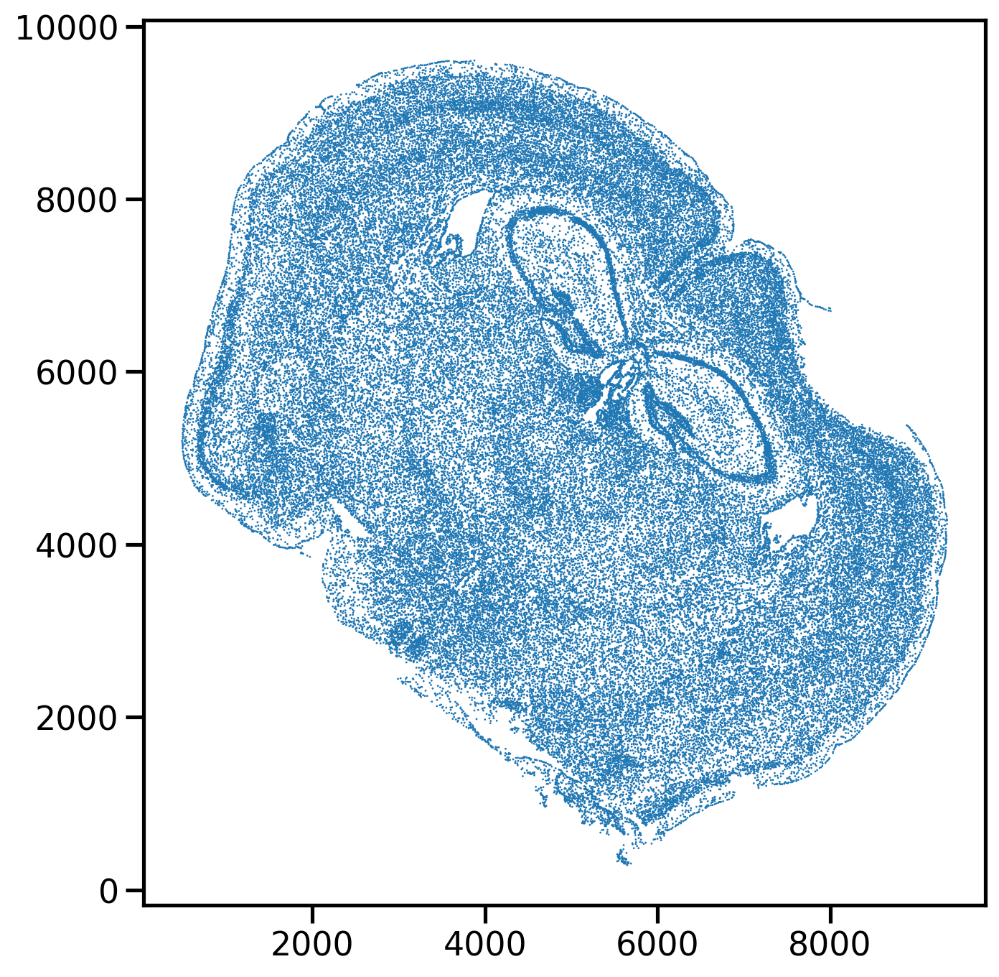

In [6]:
x = data['x'].values
y = data['y'].values
st_scatter(x, y)

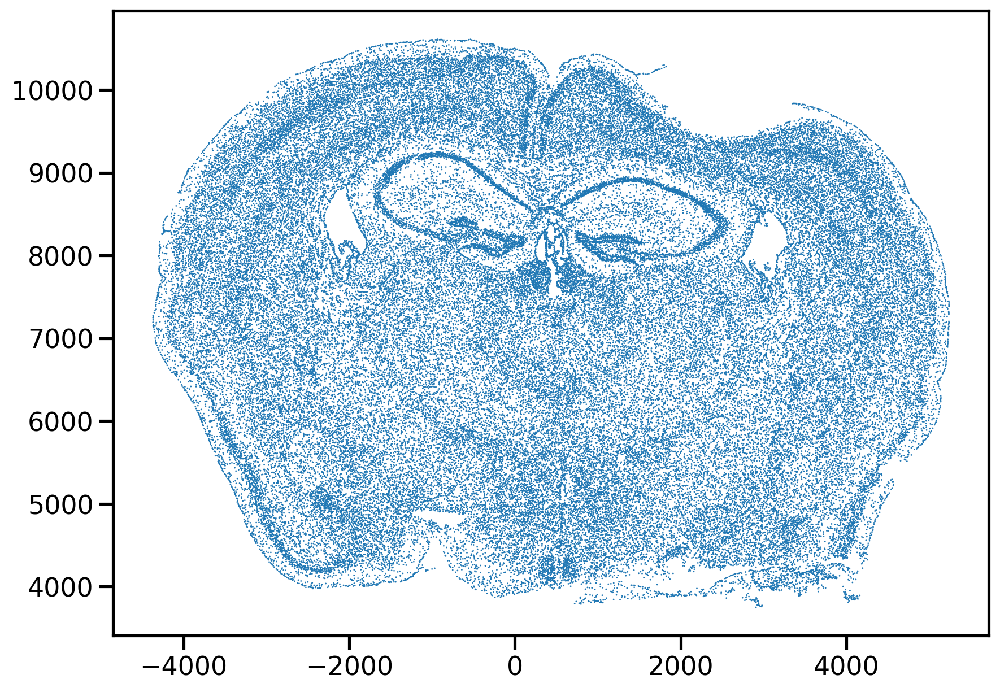

In [7]:
theta = 40
xr, yr = rot2d(x, y, theta)
st_scatter(xr, yr)

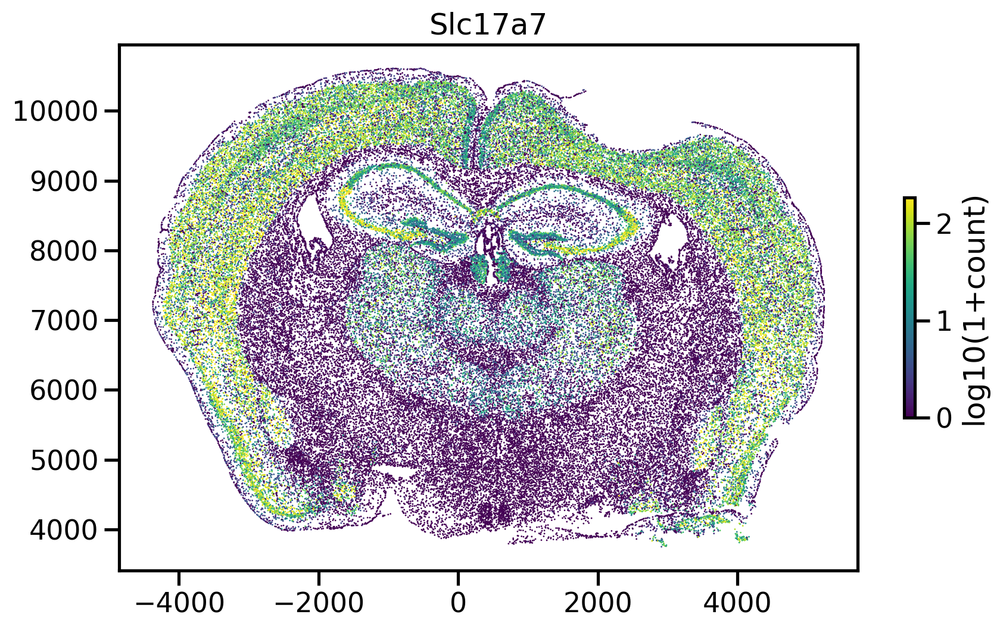

In [8]:
gene_name = 'Slc17a7'
gexp = np.log10(1+data[gene_name])

st_scatter(xr, yr, gexp, title=gene_name)

In [9]:
ftrs = data.iloc[:,2:]
ftrs

,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,Htr4,Htr5a,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,2.0,0.0,1.0,4.0,0.0,3.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
84168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,3.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0
84169,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,1.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0
84170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [10]:
# normalization by size (total counts or volume)
cov = ftrs.sum(axis=1)
medcov = np.median(cov)

# normalization by log(1+x) (squashes different orders of magnitude together)
ftrs_normed = ftrs.divide(cov/medcov, axis=0)
ftrs_normed = np.log10(1+ftrs_normed)
ftrs_normed

,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,Htr4,Htr5a,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.436543,0.89925,0.436543,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.578357,0.379082,0.0,0.229652,0.578357,0.0,0.490050,0.00000,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.416281,0.000000,0.0,0.000000,0.000000,0.0,0.416281,0.00000,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.577453,0.000000,0.0,0.000000,0.000000,0.0,0.577453,0.00000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.477121,0.000000,0.0,0.000000,0.000000,0.0,0.477121,0.00000,0.000000,0.0
84168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.873535,0.688794,0.0,0.000000,0.555031,0.0,0.555031,0.00000,0.000000,0.0
84169,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.610128,0.306425,0.0,0.000000,0.306425,0.0,0.610128,0.00000,0.000000,0.0
84170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.551755,0.358173,0.0,0.000000,0.000000,0.0,0.358173,0.00000,0.000000,0.0


In [11]:
%%time
# UMAP takes ~2.5 min
ti = time.time()
print("PCA...", end='')
pcs_normed = PCA(n_components=20).fit_transform(ftrs_normed)
print(f"done in {time.time()-ti:.2f}s")
print(pcs_normed.shape)

print("UMAP...", end='')
ucs_normed = UMAP(n_components=2).fit_transform(pcs_normed)
print(f"done in {time.time()-ti:.2f}s")
print(ucs_normed.shape)

PCA...done in 9.98s
(84172, 20)
UMAP...done in 134.93s
(84172, 2)
CPU times: user 3min 10s, sys: 8.78 s, total: 3min 19s
Wall time: 2min 14s


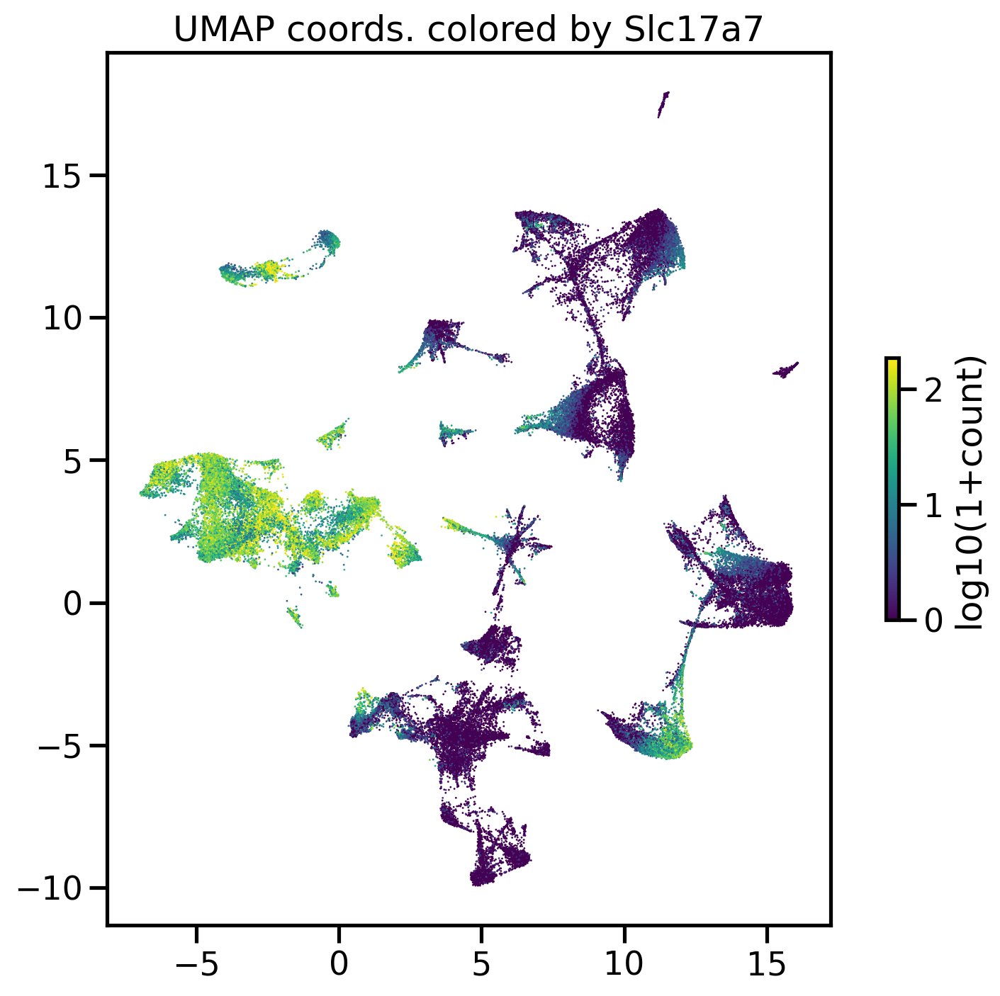

In [12]:
uc1 = ucs_normed[:,0]
uc2 = ucs_normed[:,1]
gexp = np.log10(1+ftrs['Slc17a7'])
st_scatter(uc1, uc2, gexp, title="UMAP coords. colored by Slc17a7")


## visualize individual genes in XY and UMAP 

In [13]:
def st_scatter_xy_umap(x, y, ux, uy, ftrs_normed, gene=None):
  """plot XY and UMAP side by side colored by gene
  """
  if gene is not None:
      gval = ftrs_normed[gene]

  fig, axs = plt.subplots(1, 2, figsize=(8*2,8))
  fig.suptitle(gene)
  
  ax = axs[0]
  g = ax.scatter(xr, yr, c=gval, s=1, edgecolor='none')
  ax.set_title('XY (spatial distribution)')
  ax.set_aspect('equal')
  
  ax = axs[1]
  ax.scatter(ux, uy, c=gval, s=1, edgecolor='none')
  ax.set_title('UMAP (molecular similarity)')
  ax.set_aspect('equal')
  fig.colorbar(g, ax=ax, shrink=0.3, label='normed counts\n(by size and log10(x+1))')

  return 

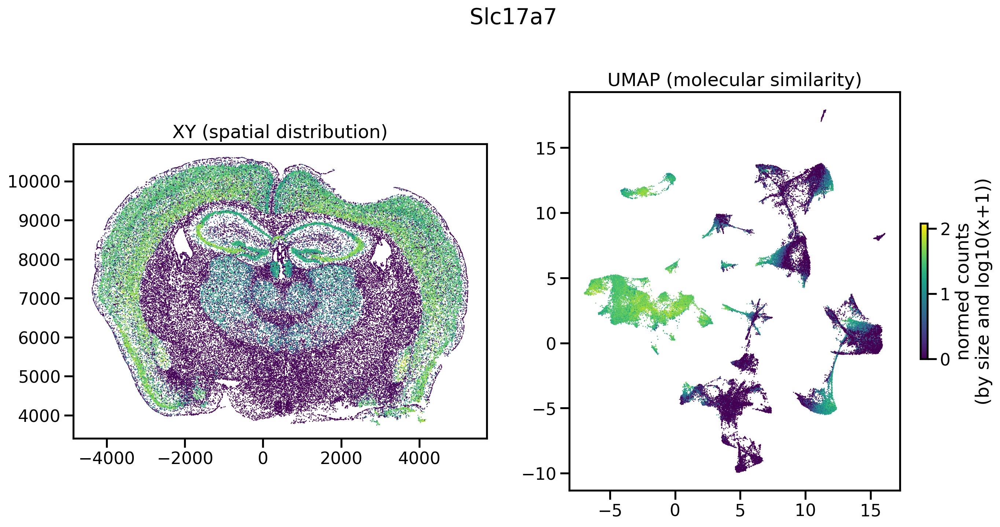

In [14]:
st_scatter_xy_umap(xr, yr, uc1, uc2, ftrs_normed, 'Slc17a7')

## Exercise 4: Clustering - KMeans
- k specifies how many clusters we aim to identify

In [15]:
# visualize clusters
def plot_cluster(clsts, x, y, ux, uy):
  """
  """
  from matplotlib import colors

  unq_clsts, inv = np.unique(clsts, return_inverse=True)
  n_unq = len(unq_clsts)
  # colors = np.array(sns.color_palette('husl', n_unq))
  # c_vec = colors[inv]

  cmap = plt.cm.jet
  norm = colors.BoundaryNorm(np.arange(-0.5, n_unq, 1), cmap.N)

  fig, axs = plt.subplots(1, 2, figsize=(8*2,8))
  
  ax = axs[0]
  g = ax.scatter(x, y, norm=norm, cmap=cmap, c=clsts, s=1, edgecolor='none')
  ax.set_title('XY (spatial distribution)')
  ax.set_aspect('equal')
  
  ax = axs[1]
  ax.scatter(ux, uy, norm=norm, cmap=cmap, c=clsts, s=1, edgecolor='none')
  ax.set_title('UMAP (molecular similarity)')
  ax.set_aspect('equal')

  fig.colorbar(g, ax=ax, label='clusters', ticks=np.arange(n_unq))

In [18]:
np.unique(clsts)

array([0, 1, 2], dtype=int32)

In [16]:
%%time
# clustering (k means clustering)
# takes ~1.5min

from sklearn.cluster import KMeans

# clustering -- in the end every cell will be assigned to a cluster
k = 3 # generate 3 clusters 
kmeans = KMeans(n_clusters=k)
clsts = kmeans.fit_predict(ftrs_normed.values)
clsts.shape, clsts

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


CPU times: user 25 s, sys: 1.32 s, total: 26.4 s
Wall time: 15.7 s


((84172,), array([1, 1, 1, ..., 1, 1, 1], dtype=int32))

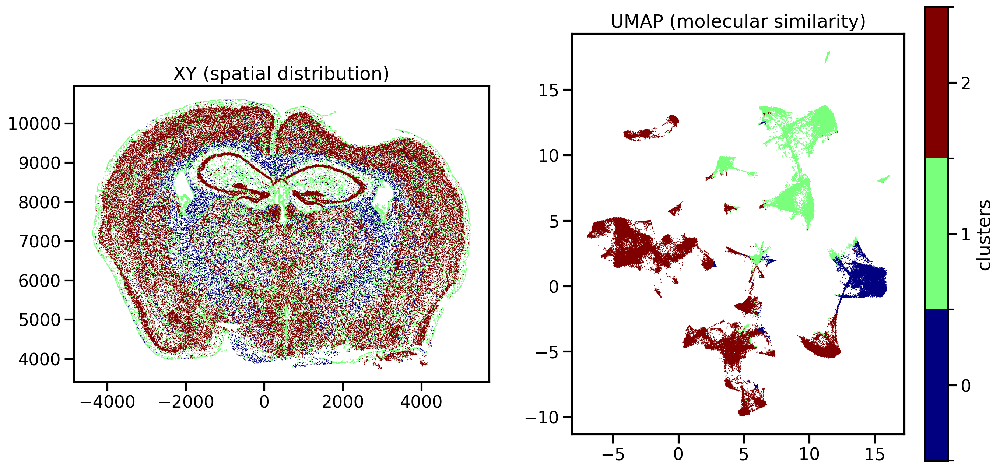

In [17]:
# plot clustering results (assuming `clsts` is a list of cluster labels for each cell)
plot_cluster(clsts, xr, yr, uc1, uc2)

In [ ]:
# Now can you repeat K-Means clustering to get
# k = 3, 5, 10, 20 clusters respectively, and plot their distributions
# in XY and UMAP coordinates?




## Bonus point 1: Cluster centroid (pseduo-bulk) profiles
- computationally merging cells from the same cell type (like a in-silico bulk RNA-seq) 

Steps:
1. create a new dataframe called `tmp` which is a copy of `ftrs_normed`
2. add a new column in `tmp` called `clst` and assign cluster labels of the cells to this column
3. use the powerful tool `tmp.groupby('clst').mean()` to calculate the mean per cluster for every gene.
4. does the result make sense to you?


Visualization:
5. z-score the results (cell-type by gene expression profiles) per gene across cell types. If `X` is your centroid matrix (cell type by gene), its zscore should be `(X-X.mean())/X.std()`. 

6. visualize the above matrix using the heatmap command from the Seaborn package (`sns.heatmap()`)

In [24]:
tmp= ftrs_normed.copy()
tmp

,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,Htr4,Htr5a,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.436543,0.89925,0.436543,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.578357,0.379082,0.0,0.229652,0.578357,0.0,0.490050,0.00000,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.416281,0.000000,0.0,0.000000,0.000000,0.0,0.416281,0.00000,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.577453,0.000000,0.0,0.000000,0.000000,0.0,0.577453,0.00000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.477121,0.000000,0.0,0.000000,0.000000,0.0,0.477121,0.00000,0.000000,0.0
84168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.873535,0.688794,0.0,0.000000,0.555031,0.0,0.555031,0.00000,0.000000,0.0
84169,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.610128,0.306425,0.0,0.000000,0.306425,0.0,0.610128,0.00000,0.000000,0.0
84170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.551755,0.358173,0.0,0.000000,0.000000,0.0,0.358173,0.00000,0.000000,0.0


In [23]:
print(tmp.shape)

(84172, 483)


In [25]:
tmp['clst']= clsts

In [26]:
tmp

,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,Htr4,Htr5a,...,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3,clst
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.0,0.436543,0.89925,0.436543,0.0,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.379082,0.0,0.229652,0.578357,0.0,0.490050,0.00000,0.000000,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.0,0.416281,0.00000,0.000000,0.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.0,0.577453,0.00000,0.000000,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84167,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.0,0.477121,0.00000,0.000000,0.0,1
84168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.688794,0.0,0.000000,0.555031,0.0,0.555031,0.00000,0.000000,0.0,1
84169,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.306425,0.0,0.000000,0.306425,0.0,0.610128,0.00000,0.000000,0.0,1
84170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.358173,0.0,0.000000,0.000000,0.0,0.358173,0.00000,0.000000,0.0,1


In [29]:
ctrds=tmp.groupby('clst').mean()
ctrds

,Oxgr1,Htr1a,Htr1b,Htr1d,Htr1f,Htr2a,Htr2b,Htr2c,Htr4,Htr5a,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
clst,,,,,,,,,,,,,,,,,,,,,
0,0.002986,0.007607,0.009111,0.001391,0.004049,0.004867,0.000072,0.012518,0.008223,0.007320,...,0.024914,0.012101,0.019606,0.004341,0.003022,0.000279,0.432785,0.018287,0.015037,0.845648
1,0.007268,0.006761,0.010160,0.001457,0.003508,0.008179,0.000532,0.038561,0.007069,0.007422,...,0.297209,0.077907,0.027249,0.053877,0.021690,0.001446,0.336782,0.220197,0.195431,0.103539
2,0.010791,0.060006,0.085864,0.014106,0.084265,0.070027,0.000743,0.120396,0.085303,0.100745,...,0.013882,0.065551,0.078682,0.022014,0.008534,0.001583,0.290229,0.006825,0.007249,0.466757


<Axes: ylabel='clst'>

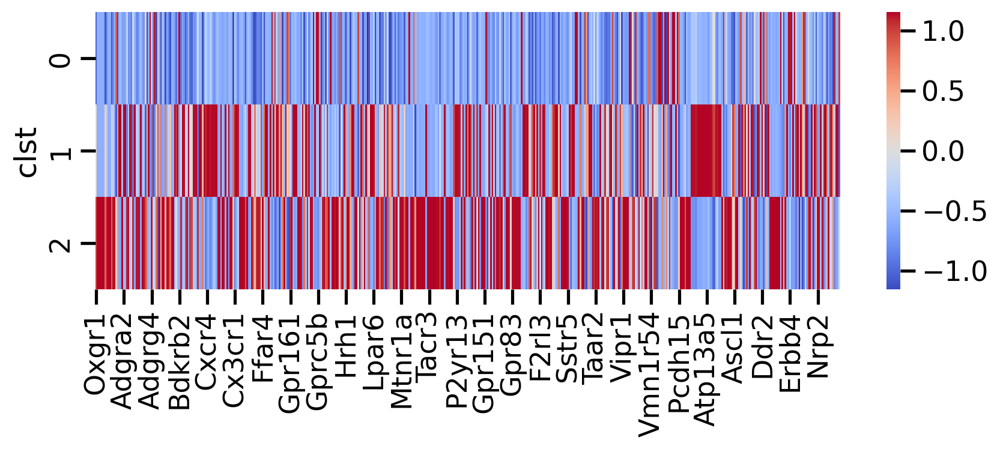

In [41]:
fig,ax =plt.subplots(figsize=(10,3))
sns.heatmap( ctrds_z, ax=ax, cmap='coolwarm')

In [37]:
#ctrds.mean()
#ctrds.mean(axis=1)
ctrds_z=(ctrds-ctrds.mean())/ctrds.std()

In [ ]:
# ctrds = ...
# ctrds_zscore = ...

In [ ]:
# visualize the results
sns.clustermap(ctrds_zscore.T, figsize=(6,10), cmap='coolwarm', center=0)

## Exercise 5 (Bonus point 2): Enrichment analysis of spatial proximity
- in the style of [Fang et al. 2022 Science](https://www.science.org/doi/10.1126/science.abm1741) (Figure 4)

- enrichment analysis (spatial neighbors of clusters) -- 
 which cell type pairs are enriched in spatial proximity

Steps:
- for each cell, get their k nearest spatial neighbors. 
  you may use `from sklearn.neighbors import NearestNeighbors`

- count the results for each cell type pair -- how many connections there are between each pair.
  you may use the function below `get_clst2clst_counts`

- compare it with what's expected by random homogenous cell types....; are they enriched?
  you may want to repeat the steps above after randomly shuffling cell type labels across cells using `np.random.choice(..., replace=False)`

In [ ]:
def get_clst2clst_counts(clsts, knn):
  """Given cluster labels (for each cell) and spatial neighbors (indices; including self), 
  Calculate how many connections (neighbor pairs) each cluster pairs have.
  Return this information as a cluster-by-cluster count matrix
  """
  from scipy import sparse
  knn_clsts = clsts[knn] # cluster label for kNN
  n_unq_clsts = len(np.unique(clsts)) # number of clusters
  
  shape = (n_unq_clsts, n_unq_clsts)
  _self = knn_clsts[:,0]
  _others = knn_clsts[:,1:]
  rows = np.repeat(_self, (k-1)) # repeat 
  cols = np.hstack(_others)
  assert len(rows) == len(cols) 
  data = np.repeat(1, len(rows))
  clst2clst_counts = sparse.coo_matrix((data, (rows, cols)), shape=shape).todense() 
  clst2clst_counts = (clst2clst_counts + clst2clst_counts.T) # each connection counted twice.
  return clst2clst_counts

In [ ]:
# for each cell, get their k nearest spatial neighbors
from sklearn.neighbors import NearestNeighbors
xy = np.vstack([xr, yr]).T

k = 1+6 # 1(self) + 6 nearest neighbors
# knn = 
print(knn.shape)
print(knn)

In [ ]:
# count number of connections for every cell type pair
clst2clst_counts = get_clst2clst_counts(clsts, knn)
clst2clst_counts

In [ ]:

# redo the above counting after shuffing cell type labels 
# clsts_shuff = 
clst2clst_counts_shuff = get_clst2clst_counts(clsts_shuff, knn)

In [ ]:
# visualize the difference between original vs shuffled cell type labels
plot_cluster(clsts, xr, yr, uc1, uc2)
plot_cluster(clsts_shuff, xr, yr, uc1, uc2)

In [ ]:
sns.heatmap(clst2clst_counts)
plt.gca().set_aspect('equal')
plt.title('observed')

In [ ]:
sns.heatmap(clst2clst_counts_shuff)
plt.gca().set_aspect('equal')
plt.title('expected')

In [ ]:
sns.heatmap(np.log2((1+clst2clst_counts)/(1+clst2clst_counts_shuff)), # 1 is pseudo count to avoid 0 in log. 
            cmap='coolwarm',
            vmax=2,vmin=-2,
            )
plt.gca().set_aspect('equal')
plt.title('enriched: log2(observed/expected)')

## Bonus follow-up questions
- How do we make sure the expected pattern is stable (not a fluke of 1 particular random shuffle)? 
- How do we evaluate the statistical significance of the enrichment?
